# Clustering Traffic Intersections

### Report prepared by: Melisa Dundar
### Advisor: Dr. Alexander Kurzhanskiy

#### Statement (summary) of work:

Our objective is to find and group similar traffic intersections based on their geometric characteristics and the given data. 
   
    COMPLETED:
    1. Fetch the intersection data for a given city.
    2. Organize the data of the intersections into a data frame.
    3. Flattened the data, convert each intersection into a document.
    4. Eyeball the data based on the automated analysis of Python Profiler.
    4. Use Jaccard Similarity to find similar documents (i.e. intersections).
    5. Downloaded US Census data set.
    6. Use city populations as a proxy for city traffic volume.
    7. Developed a function which returns similar cities given an input city.
    
    TO DO:
    1. Consider all the intersections in a city and clusted them into groups of similar intersections
    2. I gave a reference intersection then found all of the similar intersections in a given city. 
    3. Intersection clustering algorithm.
   

Useful links:

https://iit-intersections.s3-us-west-1.amazonaws.com/USA/CA/city_list.txt
https://iit-intersections.s3-us-west-1.amazonaws.com/USA/CA/Los_Gatos/intersection_list.txt
    

In [108]:
import urllib.request, json 
import pandas as pd
import numpy as np
import pprint
from pandas_profiling import ProfileReport
from multiprocessing import Pool
from sklearn.neighbors.ball_tree import BallTree

PCT_POPULATION_BAND = 0.30

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('max_colwidth', 1000)

IIT_BASE_URL = 'https://iit-intersections.s3-us-west-1.amazonaws.com/'

Definition of functions to import all of the intersection data for a given city.

In [109]:
# utility functions

def jaccard_similarity(list1, list2):
    # returns the jaccard similarity between two lists
    s1 = set(list1.split(','))
    s2 = set(list2.split(','))
    return len(s1.intersection(s2)) / len(s1.union(s2))


def scrape(url):
    # returns the intersection metadata
    intersection_url = IIT_BASE_URL + url
    with urllib.request.urlopen(intersection_url) as url:
        data = json.loads(url.read().decode())
        data['meta_data']['key'] = data['file_name']
    return data['meta_data']

        
def get_data_for_intersections(urls):
    # returns the data for a list of intersections
    p = Pool(10)
    data = p.map(scrape, urls)
    p.close()
    return data


def get_intersections_for_city(state, city_name):
    # returns the intersections for a city, state pair
    intersections = []
    url = IIT_BASE_URL + 'USA/' + state + '/' + city_name + '/intersection_list.txt'
    file = urllib.request.urlopen(url)
    for line in file:
        intersections.append(line.decode("utf-8"))
    return intersections
        

def find_similar_cities_within_radius(state, city_name, radius):
    # returns similar cities within a radius (uses population as a proxy for traffic volume)
    src_city = uscities[(uscities.city==city_name) & (uscities.admin_name==state)]
    src_population = src_city.population
    pop_lower_bound = src_population * (1 - PCT_POPULATION_BAND)
    pop_upper_bound = src_population * (1 + PCT_POPULATION_BAND)
    print(pop_lower_bound)
    distances, indices = uscities_tree.query(np.deg2rad(np.c_[src_city.lat, src_city.lng]), k=100, return_distance=True)
    target_table = uscities.iloc[indices[0]].copy()
    target_table['Distance'] = distances[0] * 3957
    target_table['Distance'] = target_table['Distance'].round(0).astype(int)
    target_table['population'] = target_table['population'].round(0).astype(int)
    target_table = target_table[(target_table['Distance'] < int(radius)) & (target_table['population'] > int(pop_lower_bound)) & (target_table['population'] < int(pop_upper_bound))]
    return target_table

In [110]:
# load census data and test the find similar cities function
uscities = pd.read_csv('data/uscities.csv')
uscities['lat'] = uscities['lat'].astype(float)
uscities['lng'] = uscities['lng'].astype(float)
uscities_latlons = uscities[['lat', 'lng']].values
uscities_tree = BallTree(np.deg2rad(uscities_latlons), metric='haversine')
uscities.sort_values('population', ascending=False).head(10)

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
0,New York,New York,40.6943,-73.9249,United States,US,USA,New York,NaN,19354922.0,1840034016
1,Los Angeles,Los Angeles,34.1139,-118.4068,United States,US,USA,California,NaN,12815475.0,1840020491
2,Chicago,Chicago,41.8373,-87.6862,United States,US,USA,Illinois,NaN,8675982.0,1840000494
3,Miami,Miami,25.7839,-80.2102,United States,US,USA,Florida,NaN,6381966.0,1840015149
4,Dallas,Dallas,32.7936,-96.7662,United States,US,USA,Texas,NaN,5733259.0,1840019440
5,Philadelphia,Philadelphia,40.0077,-75.1339,United States,US,USA,Pennsylvania,NaN,5637884.0,1840000673
6,Houston,Houston,29.7869,-95.3905,United States,US,USA,Texas,NaN,5446468.0,1840020925
7,Washington,Washington,38.9047,-77.0163,United States,US,USA,District of Columbia,primary,5289420.0,1840006060
8,Atlanta,Atlanta,33.7627,-84.4225,United States,US,USA,Georgia,admin,5228750.0,1840013660
9,Boston,Boston,42.3188,-71.0846,United States,US,USA,Massachusetts,admin,4637537.0,1840000455


In [111]:
similar_cities = find_similar_cities_within_radius('California', 'Berkeley', 50)
similar_cities.head(10)

362    85626.8
Name: population, dtype: float64


,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id,Distance
362,Berkeley,Berkeley,37.8723,-122.2760,United States,US,USA,California,NaN,122324,1840018914,0
415,Richmond,Richmond,37.9477,-122.3390,United States,US,USA,California,NaN,110040,1840020277,6
469,San Leandro,San Leandro,37.7071,-122.1601,United States,US,USA,California,NaN,90553,1840021538,13
424,Daly City,Daly City,37.6863,-122.4684,United States,US,USA,California,NaN,107074,1840018926,17
438,San Mateo,San Mateo,37.5522,-122.3122,United States,US,USA,California,NaN,104748,1840021551,22
1230,Redwood City,Redwood City,37.5026,-122.2252,United States,US,USA,California,NaN,86685,1840020304,26
1228,Napa,Napa,38.2976,-122.3011,United States,US,USA,California,NaN,87032,1840020241,29
306,Fairfield,Fairfield,38.2594,-122.0319,United States,US,USA,California,NaN,147582,1840020253,30
1201,Livermore,Livermore,37.6861,-121.7608,United States,US,USA,California,NaN,91030,1840020294,31
287,Sunnyvale,Sunnyvale,37.3836,-122.0257,United States,US,USA,California,NaN,153656,1840021573,36


Pick the state and city that you want the intersecion data and the program will return a url for each intersection in the given city.

In [112]:
# fetch the list of intersections for a city
urls = get_intersections_for_city('CA', 'Berkeley')
print(len(urls))
pprint.pprint(urls[:10])

1339
['USA/CA/Berkeley/62nd_Street-x-Adeline_Street-x-Stanford_Avenue.json\r\n',
 'USA/CA/Berkeley/62nd_Street-x-King_Street.json\r\n',
 'USA/CA/Berkeley/62nd_Street-x-Market_Street.json\r\n',
 'USA/CA/Berkeley/62nd_Street-x-Martin_Luther_King_Junior_Way.json\r\n',
 'USA/CA/Berkeley/63rd_Street-x-California_Street.json\r\n',
 'USA/CA/Berkeley/63rd_Street-x-King_Street.json\r\n',
 'USA/CA/Berkeley/63rd_Street-x-Market_Street.json\r\n',
 'USA/CA/Berkeley/63rd_Street-x-Martin_Luther_King_Junior_Way.json\r\n',
 'USA/CA/Berkeley/65th_Street-x-Harmon_Street.json\r\n',
 'USA/CA/Berkeley/65th_Street-x-Idaho_Street.json\r\n']


This call returns all the metadata for each intersection url collected earlier.

In [113]:
# fetch the metadata for intersections collected in the previous step
data = get_data_for_intersections(urls)

Organize all of the metadeta into a dataframe.

In [114]:
df = pd.DataFrame.from_dict(data)
json_struct = json.loads(df.to_json(orient="records"))    
df_flat = pd.json_normalize(json_struct)
df_flat.head(10)

,number_of_approaches,number_of_exits,max_number_of_lanes_in_approach,min_number_of_lanes_in_approach,number_of_railway_approaches,number_of_railway_exits,max_number_of_lanes_in_exit,min_number_of_lanes_in_exit,number_of_center_bicycle_approaches,number_of_right_side_bicycle_approaches,number_of_center_bicycle_exits,number_of_right_side_bicycle_exits,signal_present,pedestrian_signal_present,diameter,max_angle,max_curvature,min_curvature,distance_to_next_intersection,shortest_distance_to_railway_crossing,subway_station_present,number_of_tram/train_stops,number_of_bus/trolley_stops,stop_sign,approach_max_speed_limit,approach_min_speed_limit,exit_max_speed_limit,exit_min_speed_limit,timestamp,key,approach_street_types.residential,approach_street_types.secondary_link,approach_street_types.secondary,approach_street_types.tertiary,approach_street_types.cycleway,approach_street_types.track,exit_street_types.residential,exit_street_types.secondary,exit_street_types.tertiary,exit_street_types.cycleway,approach_counts.oneway,approach_counts.twoway,approach_counts.singleway,exit_counts.oneway,exit_counts.twoway,exit_counts.singleway,exit_street_types.track,approach_street_types.primary,exit_street_types.primary,approach_street_types.tertiary_link,approach_street_types.motorway_link,approach_street_types.primary_link,approach_street_types.unclassified,exit_street_types.unclassified
0,7,6,3,1,1,0,3,1,0,7,0,6,yes,yes,318.425922,166.239291,0.622991,0.000000,-1.000000,159.606130,no,0,0,no,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:50.084580,USA/CA/Berkeley/62nd_Street-x-Adeline_Street-x-Stanford_Avenue.json,1.0,1.0,2.0,1.0,7.0,1.0,1.0,2.0,1.0,6.0,4,2,1,3,3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5,4,1,1,0,1,1,1,0,5,0,4,None,None,64.207482,137.737464,0.592210,0.005469,74.218818,158.039287,no,0,0,None,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:51.787159,USA/CA/Berkeley/62nd_Street-x-King_Street.json,2.0,1.0,NaN,NaN,5.0,NaN,2.0,NaN,NaN,4.0,0,4,1,0,4,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,4,1,1,0,0,1,1,0,4,0,4,no,None,24.235590,116.224923,0.121171,0.000123,62.542983,-1.000000,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-01 17:35:21.287014,USA/CA/Berkeley/62nd_Street-x-Market_Street.json,1.0,NaN,NaN,1.0,5.0,NaN,1.0,NaN,1.0,6.0,2,2,0,2,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6,5,1,1,1,0,1,1,0,6,0,5,yes,yes,304.732514,168.187540,1.469993,0.000000,-1.000000,156.339009,no,0,0,no,30 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:50.076165,USA/CA/Berkeley/62nd_Street-x-Martin_Luther_King_Junior_Way.json,2.0,NaN,1.0,NaN,7.0,1.0,2.0,1.0,NaN,6.0,2,5,0,1,5,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,4,1,1,0,0,1,1,0,4,0,4,no,None,20.331728,90.430384,0.078209,0.000377,99.632989,-1.000000,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:50.613366,USA/CA/Berkeley/63rd_Street-x-California_Street.json,2.0,NaN,NaN,NaN,5.0,NaN,2.0,NaN,NaN,6.0,0,4,0,0,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,4,4,1,1,0,1,1,1,0,4,0,4,no,None,16.813382,91.156925,0.356909,0.000535,-1.000000,157.515461,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:56.640743,USA/CA/Berkeley/63rd_Street-x-King_Street.json,2.0,NaN,NaN,NaN,4.0,NaN,2.0,NaN,NaN,4.0,0,4,0,0,4,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,4,4,1,1,0,0,1,1,0,4,0,4,no,None,26.555512,115.618228,0.094872,0.000078,63.476686,-1.000000,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:55.558936,USA/CA/Berkeley/63rd_Street-x-Market_Street.json,1.0,NaN,NaN,1.0,5.0,NaN,1.0,NaN,1.0,4.0,2,2,0,2,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,5,5,1,1,1,0,1,1,0,5,0,5,yes,yes,151.755472,168.203119,1.067894,0.004068,106.729737,139.932196,no,0,0,yes,30 mph,25 mph,30 mph,25 mph,2020-06-02 00:34:57.568061,USA/CA/Berkeley/63rd_Street-x-Martin_Luther_King_Junior_Way.json,2.0,NaN,1.0,NaN,5.0,1.0,2.0,1.0,NaN,5.0,1,4,0,1,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2,2,1,1,0,0,1,1,0,2,0,2,None,None,152.017707,0.851312,0.070638,0.005585,-1.000000,-1.000000,no,0,0,None,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:59.709950,USA/CA/Berkeley/65th_Street-x-Harmon_Street.json,2.

In [115]:
profile = pandas_profiling.ProfileReport(df, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

In [116]:
df_street_with_railway = df_flat[df_flat['number_of_railway_exits'] > 0]
df_street_with_railway.head(10)

,number_of_approaches,number_of_exits,max_number_of_lanes_in_approach,min_number_of_lanes_in_approach,number_of_railway_approaches,number_of_railway_exits,max_number_of_lanes_in_exit,min_number_of_lanes_in_exit,number_of_center_bicycle_approaches,number_of_right_side_bicycle_approaches,number_of_center_bicycle_exits,number_of_right_side_bicycle_exits,signal_present,pedestrian_signal_present,diameter,max_angle,max_curvature,min_curvature,distance_to_next_intersection,shortest_distance_to_railway_crossing,subway_station_present,number_of_tram/train_stops,number_of_bus/trolley_stops,stop_sign,approach_max_speed_limit,approach_min_speed_limit,exit_max_speed_limit,exit_min_speed_limit,timestamp,key,approach_street_types.residential,approach_street_types.secondary_link,approach_street_types.secondary,approach_street_types.tertiary,approach_street_types.cycleway,approach_street_types.track,exit_street_types.residential,exit_street_types.secondary,exit_street_types.tertiary,exit_street_types.cycleway,approach_counts.oneway,approach_counts.twoway,approach_counts.singleway,exit_counts.oneway,exit_counts.twoway,exit_counts.singleway,exit_street_types.track,approach_street_types.primary,exit_street_types.primary,approach_street_types.tertiary_link,approach_street_types.motorway_link,approach_street_types.primary_link,approach_street_types.unclassified,exit_street_types.unclassified
1,5,4,1,1,0,1,1,1,0,5,0,4,None,None,64.207482,137.737464,0.592210,0.005469,74.218818,158.039287,no,0,0,None,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:51.787159,USA/CA/Berkeley/62nd_Street-x-King_Street.json,2.0,1.0,NaN,NaN,5.0,NaN,2.0,NaN,NaN,4.0,0,4,1,0,4,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,4,4,1,1,0,1,1,1,0,4,0,4,no,None,16.813382,91.156925,0.356909,0.000535,-1.000000,157.515461,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:34:56.640743,USA/CA/Berkeley/63rd_Street-x-King_Street.json,2.0,NaN,NaN,NaN,4.0,NaN,2.0,NaN,NaN,4.0,0,4,0,0,4,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,4,4,1,1,1,1,1,1,0,4,0,4,no,no,191.162817,97.830152,0.785730,0.196619,-1.000000,110.206808,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:37:17.725147,USA/CA/Berkeley/Acton_Street-x-Ward_Street.json,2.0,NaN,NaN,NaN,4.0,1.0,2.0,NaN,NaN,4.0,0,4,0,0,4,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59,5,3,1,1,4,4,1,1,0,3,0,3,no,None,17.297734,162.925765,0.647586,0.006396,37.703078,135.972383,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:37:31.150975,USA/CA/Berkeley/Addison_Street-x-Bolivar_Drive.json,2.0,NaN,NaN,NaN,3.0,4.0,2.0,NaN,NaN,3.0,0,3,2,0,3,0,4.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN
66,4,4,1,1,4,4,1,1,0,3,0,3,no,None,16.827381,90.722005,0.032159,0.000058,-1.000000,93.010606,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:37:55.165726,USA/CA/Berkeley/Addison_Street-x-Fourth_Street.json,2.0,NaN,NaN,NaN,3.0,4.0,2.0,NaN,NaN,3.0,0,4,0,0,4,0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75,4,3,1,1,4,4,1,1,0,2,0,2,no,None,16.760386,98.211043,0.077407,0.001282,37.703078,98.270805,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:38:22.683284,USA/CA/Berkeley/Addison_Street-x-Second_Street.json,2.0,NaN,NaN,NaN,2.0,4.0,2.0,NaN,NaN,2.0,0,3,1,0,3,0,5.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN
117,4,4,1,1,0,2,1,1,0,4,0,4,None,None,16.776572,90.476900,0.006455,0.000000,94.366809,161.422006,no,0,0,None,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:40:55.755236,USA/CA/Berkeley/Allston_Way-x-Fourth_Street.json,2.0,NaN,NaN,NaN,4.0,NaN,2.0,NaN,NaN,4.0,0,4,0,0,4,0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
193,5,5,5,1,1,1,5,1,0,5,0,5,yes,yes,26.233492,102.370918,0.539468,0.000000,30.330029,35.545077,no,0,0,no,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:44:39.974790,USA/CA/Berkeley/Ashby_Avenue-x-Ninth_Street.json,1.0,NaN,NaN,NaN,4.0,1.0,1.0,NaN,NaN,4.0,0,5,0,0,5,0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
221,2,2,1,1,4,4,1,1,0,2,0,2,no,None,19.181089,83.123117,0.033019,0.000000,-1.000000,85.902808,no,0,0,yes,25 mph,25 mph,25 mph,25 mph,2020-06-02 00:46:09.479526,USA/CA/Berkeley/Bancroft_Way-x-Bolivar_Drive.json,2.0,NaN,NaN,NaN,2.0,4.0,2.0,NaN,NaN,2.0,0,2,0

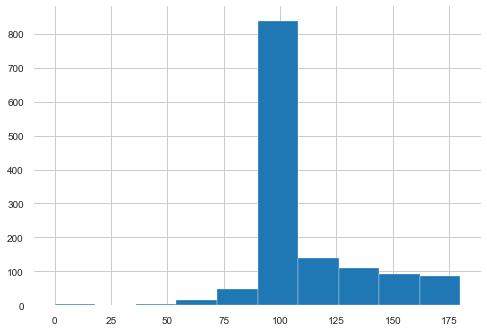

In [117]:
df_flat.max_angle.hist()

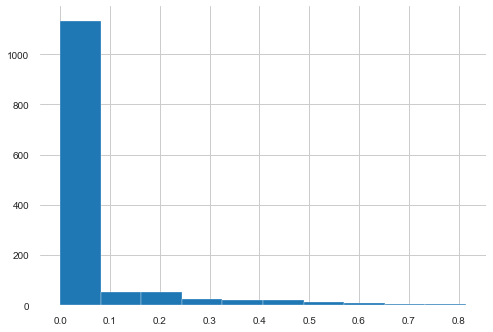

In [118]:
df_flat.min_curvature.hist()

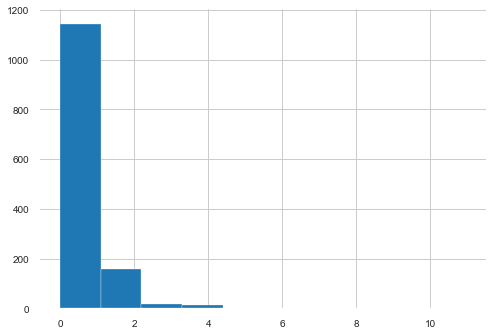

In [119]:
df_flat.max_curvature.hist()

In [120]:
df_flat.columns

Index(['number_of_approaches', 'number_of_exits',
       'max_number_of_lanes_in_approach', 'min_number_of_lanes_in_approach',
       'number_of_railway_approaches', 'number_of_railway_exits',
       'max_number_of_lanes_in_exit', 'min_number_of_lanes_in_exit',
       'number_of_center_bicycle_approaches',
       'number_of_right_side_bicycle_approaches',
       'number_of_center_bicycle_exits', 'number_of_right_side_bicycle_exits',
       'signal_present', 'pedestrian_signal_present', 'diameter', 'max_angle',
       'max_curvature', 'min_curvature', 'distance_to_next_intersection',
       'shortest_distance_to_railway_crossing', 'subway_station_present',
       'number_of_tram/train_stops', 'number_of_bus/trolley_stops',
       'stop_sign', 'approach_max_speed_limit', 'approach_min_speed_limit',
       'exit_max_speed_limit', 'exit_min_speed_limit', 'timestamp', 'key',
       'approach_street_types.residential',
       'approach_street_types.secondary_link',
       'approach_street_ty

In [121]:
selected_features = df_flat[['key', 'approach_counts.oneway', 'approach_counts.singleway',
       'approach_counts.twoway', 'approach_max_speed_limit',
       'approach_min_speed_limit', 
       'distance_to_next_intersection', 'exit_counts.oneway',
       'exit_counts.singleway', 'exit_counts.twoway', 'exit_max_speed_limit',
       'exit_min_speed_limit', 'exit_street_types.cycleway',
       'max_number_of_lanes_in_approach', 'max_number_of_lanes_in_exit',
       'min_number_of_lanes_in_exit', 'number_of_approaches',
       'number_of_bus/trolley_stops', 'number_of_center_bicycle_approaches',
       'number_of_center_bicycle_exits', 'number_of_exits',
       'pedestrian_signal_present',
       'signal_present', 'stop_sign']]
selected_features.set_index('key', inplace=True)

In [122]:
enriched_df = pd.DataFrame({col:str(col)+'=' for col in selected_features}, index=selected_features.index) + selected_features.astype(str) 
enriched_df.head(10)

,approach_counts.oneway,approach_counts.singleway,approach_counts.twoway,approach_max_speed_limit,approach_min_speed_limit,distance_to_next_intersection,exit_counts.oneway,exit_counts.singleway,exit_counts.twoway,exit_max_speed_limit,exit_min_speed_limit,exit_street_types.cycleway,max_number_of_lanes_in_approach,max_number_of_lanes_in_exit,min_number_of_lanes_in_exit,number_of_approaches,number_of_bus/trolley_stops,number_of_center_bicycle_approaches,number_of_center_bicycle_exits,number_of_exits,pedestrian_signal_present,signal_present,stop_sign
key,,,,,,,,,,,,,,,,,,,,,,,
USA/CA/Berkeley/62nd_Street-x-Adeline_Street-x-Stanford_Avenue.json,approach_counts.oneway=4,approach_counts.singleway=1,approach_counts.twoway=2,approach_max_speed_limit=25 mph,approach_min_speed_limit=25 mph,distance_to_next_intersection=-1.0,exit_counts.oneway=3,exit_counts.singleway=0,exit_counts.twoway=3,exit_max_speed_limit=25 mph,exit_min_speed_limit=25 mph,exit_street_types.cycleway=6.0,max_number_of_lanes_in_approach=3,max_number_of_lanes_in_exit=3,min_number_of_lanes_in_exit=1,number_of_approaches=7,number_of_bus/trolley_stops=0,number_of_center_bicycle_approaches=0,number_of_center_bicycle_exits=0,number_of_exits=6,pedestrian_signal_present=yes,signal_present=yes,stop_sign=no
USA/CA/Berkeley/62nd_Street-x-King_Street.json,approach_counts.oneway=0,approach_counts.singleway=1,approach_counts.twoway=4,approach_max_speed_limit=25 mph,approach_min_speed_limit=25 mph,distance_to_next_intersection=74.2188182882,exit_counts.oneway=0,exit_counts.singleway=0,exit_counts.twoway=4,exit_max_speed_limit=25 mph,exit_min_speed_limit=25 mph,exit_street_types.cycleway=4.0,max_number_of_lanes_in_approach=1,max_number_of_lanes_in_exit=1,min_number_of_lanes_in_exit=1,number_of_approaches=5,number_of_bus/trolley_stops=0,number_of_center_bicycle_approaches=0,number_of_center_bicycle_exits=0,number_of_exits=4,pedestrian_signal_present=None,signal_present=None,stop_sign=None
USA/CA/Berkeley/62nd_Street-x-Market_Street.json,approach_counts.oneway=2,approach_counts.singleway=0,approach_counts.twoway=2,approach_max_speed_limit=25 mph,approach_min_speed_limit=25 mph,distance_to_next_intersection=62.5429834957,exit_counts.oneway=2,exit_counts.singleway=0,exit_counts.twoway=2,exit_max_speed_limit=25 mph,exit_min_speed_limit=25 mph,exit_street_types.cycleway=6.0,max_number_of_lanes_in_approach=1,max_number_of_lanes_in_exit=1,min_number_of_lanes_in_exit=1,number_of_approaches=4,number_of_bus/trolley_stops=0,number_of_center_bicycle_approaches=0,number_of_center_bicycle_exits=0,number_of_exits=4,pedestrian_signal_present=None,signal_present=no,stop_sign=yes
USA/CA/Berkeley/62nd_Street-x-Martin_Luther_King_Junior_Way.json,approach_counts.oneway=2,approach_counts.singleway=0,approach_counts.twoway=5,approach_max_speed_limit=30 mph,approach_min_speed_limit=25 mph,distance_to_next_intersection=-1.0,exit_counts.oneway=1,exit_counts.singleway=0,exit_counts.twoway=5,exit_max_speed_limit=25 mph,exit_min_speed_limit=25 mph,exit_street_types.cycleway=6.0,max_number_of_lanes_in_approach=1,max_number_of_lanes_in_exit=1,min_number_of_lanes_in_exit=1,number_of_approaches=6,number_of_bus/trolley_stops=0,number_of_center_bicycle_approaches=0,number_of_center_bicycle_exits=0,number_of_exits=5,pedestrian_signal_present=yes,signal_present=yes,stop_sign=no
USA/CA/Berkeley/63rd_Street-x-California_Street.json,approach_counts.oneway=0,approach_counts.singleway=0,approach_counts.twoway=4,approach_max_speed_limit=25 mph,approach_min_speed_limit=25 mph,distance_to_next_intersection=99.632989284,exit_counts.oneway=0,exit_counts.singleway=0,exit_counts.twoway=4,exit_max_speed_limit=25 mph,exit_min_speed_limit=25 mph,exit_street_types.cycleway=6.0,max_number_of_lanes_in_approach=1,max_number_of_lanes_in_exit=1,min_number_of_lanes_in_exit=1,number_of_approaches=4,number_of_bus/trolley_stops=0,number_of_center_bicycle_approaches=0,number_of_center_bicycle_exits=0,number_of_exits=4,pedestrian_signal_present=Non

In [123]:
data_columns = ['approach_counts.oneway', 'approach_counts.singleway',
       'approach_counts.twoway', 'approach_max_speed_limit',
       'approach_min_speed_limit', 
       'distance_to_next_intersection', 'exit_counts.oneway',
       'exit_counts.singleway', 'exit_counts.twoway', 'exit_max_speed_limit',
       'exit_min_speed_limit', 'exit_street_types.cycleway',
       'max_number_of_lanes_in_approach', 'max_number_of_lanes_in_exit',
       'min_number_of_lanes_in_exit', 'number_of_approaches',
       'number_of_bus/trolley_stops', 'number_of_center_bicycle_approaches',
       'number_of_center_bicycle_exits', 'number_of_exits',
       'pedestrian_signal_present',
       'signal_present', 'stop_sign']
enriched_df['Text'] = enriched_df[data_columns].astype(str).apply(lambda x: ', '.join(x), axis = 1)

In [124]:
source_text = enriched_df.iloc[enriched_df.index.get_loc('USA/CA/Berkeley/Shattuck_Avenue-x-University_Avenue.json')]['Text']

print(source_text)

approach_counts.oneway=4, approach_counts.singleway=0, approach_counts.twoway=2, approach_max_speed_limit=25 mph, approach_min_speed_limit=25 mph, distance_to_next_intersection=147.7350276539, exit_counts.oneway=3, exit_counts.singleway=1, exit_counts.twoway=2, exit_max_speed_limit=25 mph, exit_min_speed_limit=25 mph, exit_street_types.cycleway=2.0, max_number_of_lanes_in_approach=5, max_number_of_lanes_in_exit=5, min_number_of_lanes_in_exit=2, number_of_approaches=4, number_of_bus/trolley_stops=0, number_of_center_bicycle_approaches=0, number_of_center_bicycle_exits=0, number_of_exits=5, pedestrian_signal_present=yes, signal_present=yes, stop_sign=no


In [125]:
enriched_df['jaccard_similarity'] = enriched_df.apply(lambda row : jaccard_similarity(row['Text'], source_text), axis = 1)

In [126]:
enriched_df.sort_values(by=['jaccard_similarity'], ascending=False, inplace=True)

In [127]:
enriched_df['jaccard_similarity'].head(10)

key
USA/CA/Berkeley/Shattuck_Avenue-x-University_Avenue.json    1.000000
USA/CA/Berkeley/Addison_Street-x-Shattuck_Avenue.json       0.533333
USA/CA/Berkeley/University_Avenue-x-Walnut_Street.json      0.483871
USA/CA/Berkeley/Adeline_Street-x-Stuart_Street.json         0.483871
USA/CA/Berkeley/Cedar_Street-x-Shattuck_Avenue.json         0.483871
USA/CA/Berkeley/Carleton_Street-x-Shattuck_Avenue.json      0.437500
USA/CA/Berkeley/Center_Street-x-Shattuck_Avenue.json        0.437500
USA/CA/Berkeley/Channing_Way-x-Shattuck_Avenue.json         0.437500
USA/CA/Berkeley/Ninth_Street-x-University_Avenue.json       0.437500
USA/CA/Berkeley/Northbrae_Tunnel-x-Sutter_Street.json       0.437500
Name: jaccard_similarity, dtype: float64